## load base files

In [ ]:
!git clone https://github.com/pedropro/TACO.git

Cloning into 'TACO'...
remote: Enumerating objects: 740, done.
remote: Total 740 (delta 0), reused 0 (delta 0), pack-reused 740 (from 1)
Receiving objects: 100% (740/740), 107.77 MiB | 14.99 MiB/s, done.
Resolving deltas: 100% (498/498), done.


In [ ]:
%cd TACO
! python download.py
%cd ..

/content/TACO
Note. If for any reason the connection is broken. Just call me again and I will start where I left.
Finished
/content


In [ ]:
import os

# Check the number of batch folders downloaded
data_path = 'TACO/data/'
batches = [folder for folder in os.listdir(data_path) if folder.startswith('batch_')]
print(f"Total number of batches: {len(batches)}")

Total number of batches: 15


In [ ]:
import json
import os

# Path to the annotations file
annotations_path = 'TACO/data/annotations.json'

# Check if the annotations file exists
if os.path.exists(annotations_path):
    with open(annotations_path, 'r') as f:
        data = json.load(f)

    # Get the number of images, categories, and annotations
    num_images = len(data['images'])  # List of images
    num_categories = len(data['categories'])  # List of categories
    num_annotations = len(data['annotations'])  # List of annotations

    print(f"Number of images: {num_images}")
    print(f"Number of categories: {num_categories}")
    print(f"Number of annotations: {num_annotations}")
else:
    print(f"Annotations file not found at: {annotations_path}")


Number of images: 1500
Number of categories: 60
Number of annotations: 4784


In [ ]:
import json

# Load the annotations file
with open('TACO/data/annotations.json') as f:
    data = json.load(f)

## convert data into yolo format

In [ ]:
import json
import os
from pathlib import Path
import shutil

# Paths to your TACO dataset
coco_json_path = 'TACO/data/annotations.json'  # Path to TACO's annotations file
images_dir = 'TACO/data'                       # Path to TACO's main image directory with batch subfolders
output_dir = 'yolo_top_categories'             # Base directory for YOLO format

# Ensure output directories for images and labels
Path(output_dir, 'images').mkdir(parents=True, exist_ok=True)
Path(output_dir, 'labels').mkdir(parents=True, exist_ok=True)

# Load TACO annotations
with open(coco_json_path, 'r') as f:
    data = json.load(f)

# Get category mappings
categories = {category['id']: category['name'] for category in data['categories']}

# Counter for unique filenames
file_counter = 1

# Process each image and corresponding annotations
for img in data['images']:
    img_id = img['id']
    img_file_name = img['file_name']  # This should be in the format 'batch_x/filename.jpg'
    img_width, img_height = img['width'], img['height']

    # Derive the image path within one of the 15 batch folders
    img_path = os.path.join(images_dir, img_file_name)

    # Create a unique integer-based name for each image and label
    unique_name = str(file_counter)
    img_extension = os.path.splitext(img_file_name)[1]  # Preserve the original extension (e.g., .jpg, .png)

    # Copy image to the images directory with the new unique name
    output_image_path = os.path.join(output_dir, 'images', unique_name + img_extension)
    if os.path.exists(img_path):
        shutil.copy(img_path, output_image_path)

        # Create a corresponding label file with the same unique integer name
        label_file_path = os.path.join(output_dir, 'labels', unique_name + '.txt')
        with open(label_file_path, 'w') as label_file:
            # Find all annotations for the current image
            for ann in data['annotations']:
                if ann['image_id'] == img_id:
                    category_id = ann['category_id']
                    # Ensure the category is in our mapping
                    if category_id in categories:
                        # YOLO format requires x_center, y_center, width, and height normalized
                        x, y, width, height = ann['bbox']
                        x_center = (x + width / 2) / img_width
                        y_center = (y + height / 2) / img_height
                        width /= img_width
                        height /= img_height

                        # Write the label file in YOLO format: <class_id> <x_center> <y_center> <width> <height>
                        label_file.write(f"{category_id} {x_center} {y_center} {width} {height}\n")

        # Increment the counter for the next file
        file_counter += 1

# Print the total number of images moved
print(f"Total number of images processed: {file_counter - 1}")

Total number of images processed: 1500


## deleting unwanted categories

In [ ]:
import os

# Define the new category mapping with unwanted categories removed
desired_categories = {
    36: 0,  # Plastic film
    59: 1,  # Cigarette
    5: 2,   # Clear plastic bottle
    7: 3,   # Plastic bottle cap
    12: 4   # Drink can
}

# Path to the directory containing all label files (no split folders)
label_dir = 'yolo_top_categories/labels'  # Adjust if necessary

# Loop over all label files in the labels directory
for label_file in os.listdir(label_dir):
    label_file_path = os.path.join(label_dir, label_file)

    # Read the original label data
    with open(label_file_path, 'r') as file:
        lines = file.readlines()

    # Prepare a list to hold the updated lines
    updated_lines = []

    # Process each line in the label file
    for line in lines:
        # Parse the line to get the category ID and bounding box values
        parts = line.strip().split()
        category_id = int(parts[0])

        # Check if the category ID is in the desired mapping
        if category_id in desired_categories:
            # Update the category ID to the new mapping
            new_category_id = desired_categories[category_id]

            # Create the updated line with the new category ID
            updated_line = f"{new_category_id} " + " ".join(parts[1:]) + "\n"
            updated_lines.append(updated_line)

    # Write the updated lines back to the file
    with open(label_file_path, 'w') as file:
        file.writelines(updated_lines)

print("Label files have been updated with only the specified categories and new IDs.")

Label files have been updated with only the specified categories and new IDs.


## delete files that don't contain objects of interest

In [ ]:
import os

# Path to the base directory containing unified 'images' and 'labels' folders
base_dir = 'yolo_top_categories'  # Adjust if necessary
label_dir = os.path.join(base_dir, 'labels')
image_dir = os.path.join(base_dir, 'images')

# Initialize a counter for deleted files
total_deleted_files = 0

# Loop over each label file in the labels directory
for label_file in os.listdir(label_dir):
    label_file_path = os.path.join(label_dir, label_file)

    # Check if the label file is empty
    if os.path.getsize(label_file_path) == 0:
        # Construct possible image file paths
        base_image_name = os.path.splitext(label_file)[0]
        image_file_path_jpg = os.path.join(image_dir, base_image_name + '.jpg')
        image_file_path_jpg_upper = os.path.join(image_dir, base_image_name + '.JPG')

        # Delete the label file
        os.remove(label_file_path)
        total_deleted_files += 1

        # Delete the associated image file if it exists
        if os.path.exists(image_file_path_jpg):
            os.remove(image_file_path_jpg)
            total_deleted_files += 1
        elif os.path.exists(image_file_path_jpg_upper):
            os.remove(image_file_path_jpg_upper)
            total_deleted_files += 1

# Print the total number of files deleted
print(f"Total number of files deleted (label and image): {total_deleted_files}")

Total number of files deleted (label and image): 1374


## split the data into train/val/test sections

In [ ]:
import shutil
import random

random.seed(42)

# Set the split ratios
train_ratio = 0.7
val_ratio = 0.2
test_ratio = 0.1

# Ensure output directories for each split
for split in ['train', 'val', 'test']:
    os.makedirs(os.path.join(base_dir, split, 'images'), exist_ok=True)
    os.makedirs(os.path.join(base_dir, split, 'labels'), exist_ok=True)

# Get a list of all images and shuffle them
all_images = [f for f in os.listdir(image_dir) if os.path.isfile(os.path.join(image_dir, f))]
random.shuffle(all_images)

# Calculate split sizes
num_train = int(len(all_images) * train_ratio)
num_val = int(len(all_images) * val_ratio)

# Assign images to each split
train_images = all_images[:num_train]
val_images = all_images[num_train:num_train + num_val]
test_images = all_images[num_train + num_val:]

# Move files to their respective split directories
for split, images in zip(['train', 'val', 'test'], [train_images, val_images, test_images]):
    for image_file in images:
        # Move image file
        src_image_path = os.path.join(image_dir, image_file)
        dst_image_path = os.path.join(base_dir, split, 'images', image_file)
        shutil.move(src_image_path, dst_image_path)

        # Move corresponding label file
        label_file = os.path.splitext(image_file)[0] + '.txt'
        src_label_path = os.path.join(label_dir, label_file)
        dst_label_path = os.path.join(base_dir, split, 'labels', label_file)
        if os.path.exists(src_label_path):  # Ensure corresponding label file exists
            shutil.move(src_label_path, dst_label_path)

# Print the number of images in each split
print(f"Number of images in train: {len(train_images)}")
print(f"Number of images in val: {len(val_images)}")
print(f"Number of images in test: {len(test_images)}")

Number of images in train: 569
Number of images in val: 162
Number of images in test: 82


## delete images under yolo_top_categories/images and labels

In [ ]:
# Paths to the original images and labels directories
image_dir = os.path.join(base_dir, 'images')
label_dir = os.path.join(base_dir, 'labels')

# Delete the original images and labels directories
if os.path.exists(image_dir):
    shutil.rmtree(image_dir)

if os.path.exists(label_dir):
    shutil.rmtree(label_dir)

print("Original images and labels directories have been deleted.")

Original images and labels directories have been deleted.


## oversample the underrepresented categories

In [ ]:
import os
from collections import Counter

def count_class_instances(label_dir):
    class_counts = Counter()
    for label_file in os.listdir(label_dir):
        label_file_path = os.path.join(label_dir, label_file)
        with open(label_file_path, 'r') as f:
            lines = f.readlines()
            for line in lines:
                class_id = int(line.strip().split()[0])
                class_counts[class_id] += 1
    return class_counts

# Paths to training labels
train_label_dir = os.path.join(base_dir, 'train', 'labels')

# Get class counts
class_counts = count_class_instances(train_label_dir)

print("Class distribution in the training set:")
for class_id, count in class_counts.items():
    print(f"Class {class_id}: {count} instances")


Class distribution in the training set:
Class 2: 195 instances
Class 0: 324 instances
Class 1: 476 instances
Class 4: 173 instances
Class 3: 148 instances


In [ ]:
# Determine the threshold for underrepresentation (e.g., 50% of the max count)
max_count = max(class_counts.values())
threshold = 0.8 * max_count

# Identify underrepresented classes
underrepresented_classes = [class_id for class_id, count in class_counts.items() if count < threshold]

print("\nUnderrepresented classes:")
for class_id in underrepresented_classes:
    print(f"Class {class_id}: {class_counts[class_id]} instances")


Underrepresented classes:
Class 2: 195 instances
Class 0: 324 instances
Class 4: 173 instances
Class 3: 148 instances


In [ ]:
# Calculate the number of instances needed for each underrepresented class

target_count = int(0.90* max_count)  # 80% of the max count

instances_needed = {}
for class_id, count in class_counts.items():
    if count < target_count:
        instances_needed[class_id] = int(target_count - count)

print("\nInstances needed for balance:")
for class_id, count_needed in instances_needed.items():
    print(f"Class {class_id}: {count_needed} instances needed")


Instances needed for balance:
Class 2: 233 instances needed
Class 0: 104 instances needed
Class 4: 255 instances needed
Class 3: 280 instances needed


In [ ]:
# Initialize a mapping from class IDs to image filenames
images_to_duplicate = {class_id: [] for class_id in underrepresented_classes}

# Loop through label files to identify suitable images
for label_file in os.listdir(train_label_dir):
    label_file_path = os.path.join(train_label_dir, label_file)
    with open(label_file_path, 'r') as f:
        lines = f.readlines()
        image_classes = set()
        for line in lines:
            class_id = int(line.strip().split()[0])
            image_classes.add(class_id)
        # Check if the image contains only underrepresented classes
        if image_classes.issubset(underrepresented_classes):
            for class_id in image_classes:
                images_to_duplicate[class_id].append(label_file)

In [ ]:
import shutil
import numpy as np

# Directory paths
train_image_dir = os.path.join(base_dir, 'train', 'images')
train_label_dir = os.path.join(base_dir, 'train', 'labels')

# Counter for new filenames
duplication_counter = 0

# Oversample images for each underrepresented class
for class_id in underrepresented_classes:
    count_needed = instances_needed[class_id]
    available_labels = images_to_duplicate[class_id]
    if not available_labels:
        print(f"No images found containing only class {class_id}")
        continue

    total_images = len(available_labels)
    duplicates_per_image = int(np.ceil(count_needed / total_images))

    for label_filename in available_labels:
        if count_needed <= 0:
            break

        image_filename = os.path.splitext(label_filename)[0]
        image_extensions = ['.jpg', '.png', '.jpeg']  # Adjust based on your dataset

        # Find the correct image extension
        for ext in image_extensions:
            image_path = os.path.join(train_image_dir, image_filename + ext)
            if os.path.exists(image_path):
                break
        else:
            continue  # Skip if image file not found

        label_path = os.path.join(train_label_dir, label_filename)

        for _ in range(duplicates_per_image):
            if count_needed <= 0:
                break

            # Create new filenames for duplicated files
            new_image_filename = f"{image_filename}_dup_{duplication_counter}{ext}"
            new_label_filename = f"{image_filename}_dup_{duplication_counter}.txt"

            new_image_path = os.path.join(train_image_dir, new_image_filename)
            new_label_path = os.path.join(train_label_dir, new_label_filename)

            # Copy image and label files
            shutil.copy(image_path, new_image_path)
            shutil.copy(label_path, new_label_path)

            count_needed -= len(open(label_path).readlines())
            duplication_counter += 1

print(f"\nOversampling completed. Duplicated images {duplication_counter} times.")


Oversampling completed. Duplicated images 393 times.


In [ ]:
# Re-count class instances after oversampling
new_class_counts = count_class_instances(train_label_dir)

print("\nUpdated class distribution in the training set:")
for class_id in sorted(new_class_counts.keys()):
    print(f"Class {class_id}: {new_class_counts[class_id]} instances")


Updated class distribution in the training set:
Class 0: 483 instances
Class 1: 476 instances
Class 2: 442 instances
Class 3: 379 instances
Class 4: 413 instances


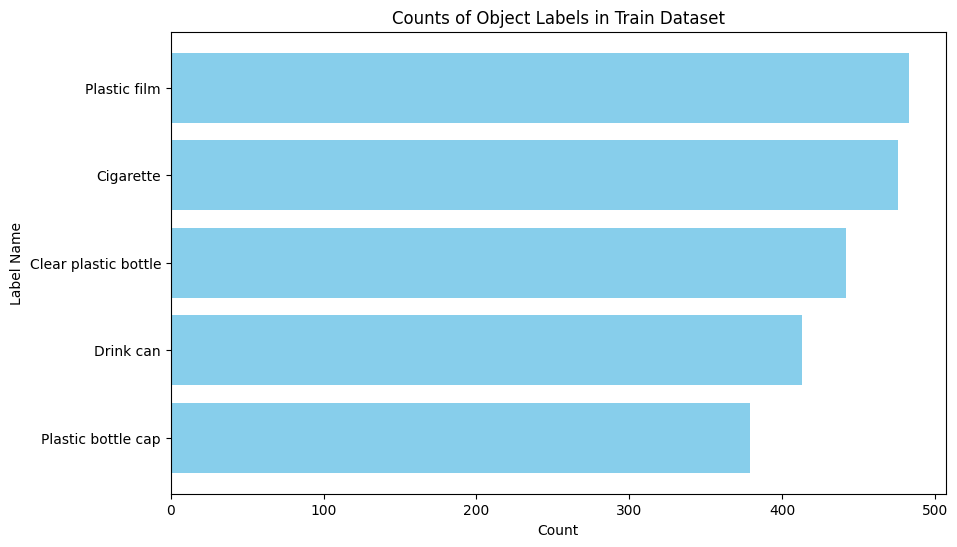

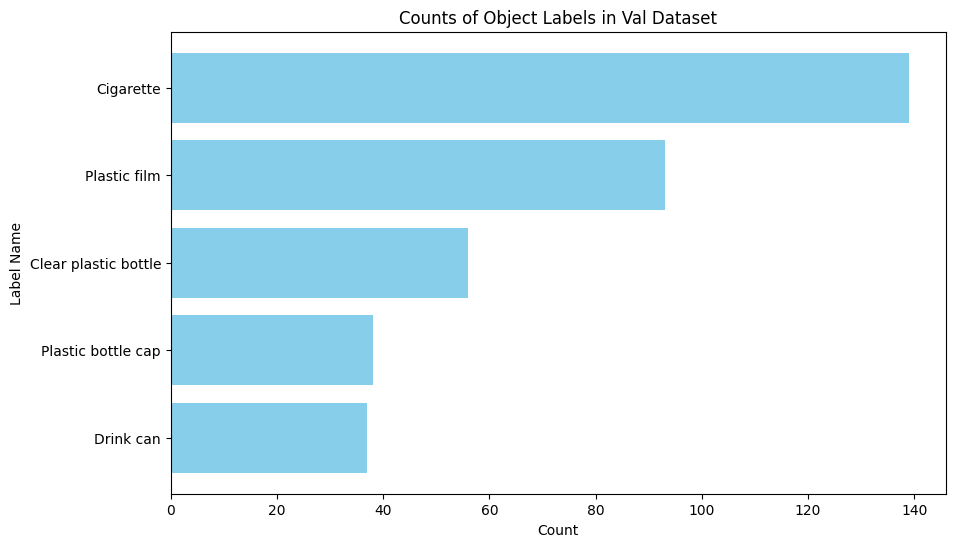

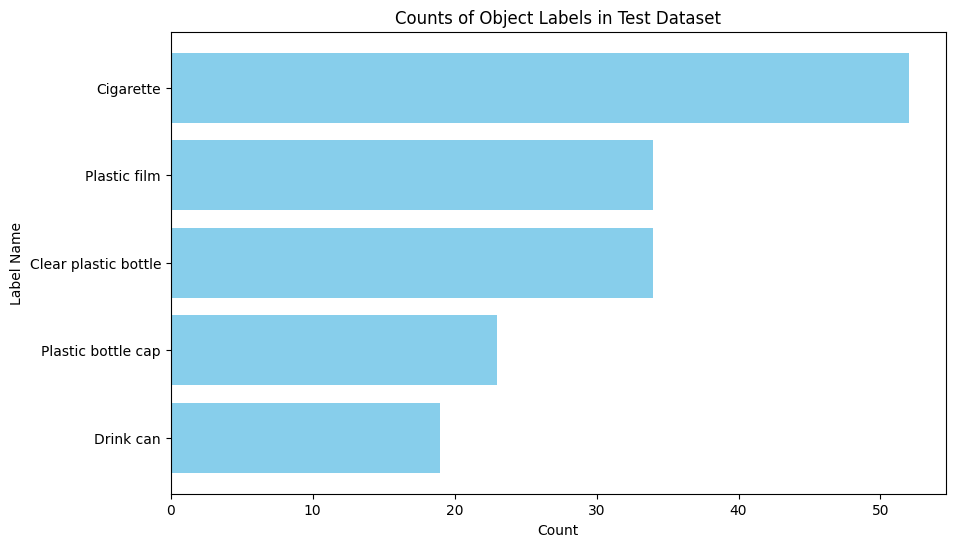

In [ ]:
import matplotlib.pyplot as plt

# Define a mapping from label IDs to names, excluding unwanted categories
label_names = {
    0: "Plastic film",
    1: "Cigarette",
    2: "Clear plastic bottle",
    3: "Plastic bottle cap",
    4: "Drink can"
}



# Function to plot label counts for a given split
def plot_label_counts(split, label_counts):
    # Convert label IDs to label names and sort by count
    labels, counts = zip(*sorted(
        [(label_names[label_id], count) for label_id, count in label_counts.items()],
        key=lambda x: x[1]
    ))

    # Plotting a horizontal bar chart for the split
    plt.figure(figsize=(10, 6))
    plt.barh(labels, counts, color='skyblue')
    plt.xlabel("Count")
    plt.ylabel("Label Name")
    plt.title(f"Counts of Object Labels in {split.capitalize()} Dataset")
    plt.show()

# Loop through each split and calculate label distributions
for split in ['train', 'val', 'test']:
    label_dir_split = os.path.join(base_dir, split, 'labels')

    # Initialize a counter for label counts for the current split
    label_counts = Counter()

    # Loop over each label file in the current label directory
    for label_file in os.listdir(label_dir_split):
        label_file_path = os.path.join(label_dir_split, label_file)

        # Read the label file
        with open(label_file_path, 'r') as file:
            lines = file.readlines()

            # Count each label in the file
            for line in lines:
                parts = line.strip().split()
                label_id = int(parts[0])  # The label ID is the first element
                label_counts[label_id] += 1

    # Plot label counts for the current split
    plot_label_counts(split, label_counts)


In [ ]:
import yaml

# Define the details for the YAML file, excluding unwanted categories
data_config = {
    'train': '/content/yolo_top_categories/train/images',
    'val': '/content/yolo_top_categories/val/images',
    'test': '/content/yolo_top_categories/test/images',
    'nc': 5,  # Updated number of classes
    'names': [
        "Plastic film",
        "Cigarette",
        "Clear plastic bottle",
        "Plastic bottle cap",
        "Drink can"
    ]
}

# Write to a YAML file
yaml_file_path = 'taco.yaml'  # Path where the YAML file will be saved
with open(yaml_file_path, 'w') as file:
    yaml.dump(data_config, file, default_flow_style=False)

print(f"YAML file created at: {yaml_file_path}")

YAML file created at: taco.yaml


In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 887.0/887.0 kB 52.5 MB/s eta 0:00:00


In [ ]:
from ultralytics import YOLO

# Path to the YAML configuration file
data_yaml = 'taco.yaml'  # Update with the path to your taco.yaml file
model_type = 'yolo11m.pt'  # You can use other YOLOv8 models like yolov8s.pt, yolov8m.pt, etc.

# Load a pre-trained YOLOv8 model
model = YOLO(model_type)  # Ensure pretrained weights are used

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 38.8M/38.8M [00:00<00:00, 285MB/s]


In [ ]:
# Train the model
model.train(
    data=data_yaml,
    epochs=200,             # Increased epochs from 100 to 200
    imgsz=1536,
    batch=16,
    patience=30,            # Increased patience from 15 to 30
    freeze=5,
    lr0=1e-5,               # Reduced initial learning rate
    optimizer='Adam',       # Ensure optimizer is set (default is usually 'SGD' or 'Adam')
    mixup=0.2,              # Increased MixUp augmentation probability
    degrees=30.0,           # Introduced rotation augmentation
    shear=2.0,              # Introduced shear augmentation
    cos_lr=True,            # Enabled cosine learning rate scheduler
    save=True,              # Save the best model during training # Set save=True to ensure checkpoints are saved
    project='runs/detect',  # Specify a directory to save checkpoints (optional but recommended)
    name='train',            # Assign a name to the training run (optional)
    scale=1,
)


Ultralytics 8.3.32 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
engine/trainer: task=detect, mode=train, model=yolo11m.pt, data=taco.yaml, epochs=200, time=None, patience=30, batch=16, imgsz=1536, save=True, save_period=-1, cache=False, device=None, workers=8, project=runs/detect, name=train, exist_ok=False, pretrained=True, optimizer=Adam, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=True, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=5, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes

100%|██████████| 755k/755k [00:00<00:00, 110MB/s]


Overriding model.yaml nc=80 with nc=5

                   from  n    params  module                                       arguments                     
  0                  -1  1      1856  ultralytics.nn.modules.conv.Conv             [3, 64, 3, 2]                 
  1                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  2                  -1  1    111872  ultralytics.nn.modules.block.C3k2            [128, 256, 1, True, 0.25]     
  3                  -1  1    590336  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 2]              
  4                  -1  1    444928  ultralytics.nn.modules.block.C3k2            [256, 512, 1, True, 0.25]     
  5                  -1  1   2360320  ultralytics.nn.modules.conv.Conv             [512, 512, 3, 2]              
  6                  -1  1   1380352  ultralytics.nn.modules.block.C3k2            [512, 512, 1, True]           
  7                  -1  1   2360320  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 356MB/s]


AMP: checks passed ✅


train: Scanning /content/yolo_top_categories/train/labels... 962 images, 0 backgrounds, 0 corrupt: 100%|██████████| 962/962 [00:00<00:00, 1048.86it/s]


train: New cache created: /content/yolo_top_categories/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 1.4.21 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /content/yolo_top_categories/val/labels... 162 images, 0 backgrounds, 0 corrupt: 100%|██████████| 162/162 [00:00<00:00, 818.97it/s]

val: New cache created: /content/yolo_top_categories/val/labels.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: Adam(lr=1e-05, momentum=0.937) with parameter groups 106 weight(decay=0.0), 113 weight(decay=0.0005), 112 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 1536 train, 1536 val
Using 8 dataloader workers
Logging results to runs/detect/train
Starting training for 200 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/200      29.8G      1.894       4.01      1.869          1       1536: 100%|██████████| 61/61 [00:30<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.32it/s]

                   all        162        363       0.28       0.27      0.157     0.0595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/200      29.4G        1.7      2.445      1.678          8       1536: 100%|██████████| 61/61 [00:27<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.55it/s]

                   all        162        363      0.345      0.357      0.274      0.102



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/200      29.3G      1.702      2.347      1.663          5       1536: 100%|██████████| 61/61 [00:27<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.73it/s]

                   all        162        363      0.414      0.379      0.325      0.124



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/200      29.4G      1.575       2.09       1.55          8       1536: 100%|██████████| 61/61 [00:27<00:00,  2.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.77it/s]

                   all        162        363      0.434      0.419      0.371      0.163



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/200      29.3G       1.55      2.044      1.536         11       1536: 100%|██████████| 61/61 [00:26<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.50it/s]

                   all        162        363      0.418      0.461      0.388      0.177



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/200      29.3G      1.527       2.08      1.547         33       1536: 100%|██████████| 61/61 [00:27<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.62it/s]

                   all        162        363      0.527      0.426      0.409      0.209



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/200      29.3G      1.494      1.941      1.488         15       1536: 100%|██████████| 61/61 [00:28<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.87it/s]

                   all        162        363      0.514      0.462      0.421      0.231



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/200      29.3G      1.491      1.891      1.498          7       1536: 100%|██████████| 61/61 [00:27<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.59it/s]

                   all        162        363      0.549      0.465      0.434      0.238



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/200      28.9G      1.464       1.82      1.488         13       1536: 100%|██████████| 61/61 [00:26<00:00,  2.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.46it/s]

                   all        162        363      0.522      0.469      0.428      0.235



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/200      29.3G      1.426      1.806      1.476          3       1536: 100%|██████████| 61/61 [00:26<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.61it/s]

                   all        162        363      0.527      0.499      0.432      0.259



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/200      29.4G      1.431       1.78      1.436         22       1536: 100%|██████████| 61/61 [00:27<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.83it/s]

                   all        162        363      0.508      0.521       0.46      0.282



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/200      29.4G      1.415      1.688      1.453          7       1536: 100%|██████████| 61/61 [00:26<00:00,  2.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.57it/s]

                   all        162        363      0.543      0.492      0.455      0.276



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/200      29.3G      1.393      1.649      1.408         23       1536: 100%|██████████| 61/61 [00:26<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.69it/s]

                   all        162        363      0.587       0.48      0.479      0.292



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/200      29.3G      1.395      1.637      1.436         11       1536: 100%|██████████| 61/61 [00:27<00:00,  2.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.60it/s]

                   all        162        363      0.514      0.504      0.478       0.28



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/200      29.3G      1.353      1.568       1.41          8       1536: 100%|██████████| 61/61 [00:26<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.31it/s]

                   all        162        363      0.544      0.472      0.474      0.277



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/200        29G      1.367      1.564      1.395          6       1536: 100%|██████████| 61/61 [00:27<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.69it/s]

                   all        162        363      0.585      0.482      0.503      0.311



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/200      29.5G      1.352      1.614      1.412         17       1536: 100%|██████████| 61/61 [00:26<00:00,  2.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.26it/s]

                   all        162        363       0.57      0.469      0.504      0.324



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/200      29.4G       1.36      1.557      1.388          7       1536: 100%|██████████| 61/61 [00:27<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.49it/s]


                   all        162        363        0.6       0.46      0.506      0.301

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/200      29.4G      1.348      1.556      1.387         13       1536: 100%|██████████| 61/61 [00:27<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.69it/s]

                   all        162        363      0.581      0.471      0.516      0.336



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/200      29.3G      1.361      1.534      1.389          4       1536: 100%|██████████| 61/61 [00:26<00:00,  2.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.64it/s]

                   all        162        363        0.5      0.515      0.515      0.336



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/200      29.4G      1.319      1.475      1.368         32       1536: 100%|██████████| 61/61 [00:27<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.62it/s]

                   all        162        363      0.616      0.461       0.52       0.34



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/200      29.4G      1.316       1.48      1.352         14       1536: 100%|██████████| 61/61 [00:27<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.72it/s]

                   all        162        363      0.561      0.498      0.525      0.345



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/200      29.3G      1.307      1.454      1.353         17       1536: 100%|██████████| 61/61 [00:27<00:00,  2.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.43it/s]

                   all        162        363      0.566      0.497      0.524      0.333



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/200      29.3G      1.297      1.409      1.327          2       1536: 100%|██████████| 61/61 [00:26<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.47it/s]

                   all        162        363       0.57      0.473      0.524      0.353



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/200      29.4G      1.287      1.408      1.351          2       1536: 100%|██████████| 61/61 [00:27<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.62it/s]

                   all        162        363      0.548      0.518      0.528      0.338



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/200      29.3G      1.304       1.42      1.351          4       1536: 100%|██████████| 61/61 [00:27<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.52it/s]

                   all        162        363      0.579      0.484      0.529       0.34



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/200      29.3G       1.28      1.357      1.334         18       1536: 100%|██████████| 61/61 [00:27<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.58it/s]

                   all        162        363      0.583      0.508      0.533      0.349



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/200      29.4G        1.3      1.433      1.331         12       1536: 100%|██████████| 61/61 [00:27<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.68it/s]

                   all        162        363      0.586      0.502      0.532      0.349



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/200      29.3G      1.259       1.33      1.312          8       1536: 100%|██████████| 61/61 [00:27<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.57it/s]

                   all        162        363      0.592      0.516       0.54      0.358



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/200      29.5G       1.25      1.334      1.326         10       1536: 100%|██████████| 61/61 [00:28<00:00,  2.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.60it/s]

                   all        162        363      0.561      0.531      0.537      0.357



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/200      29.5G      1.281      1.371      1.333          6       1536: 100%|██████████| 61/61 [00:27<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.54it/s]

                   all        162        363      0.631      0.468      0.527      0.355



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/200      29.5G      1.262      1.335      1.313          6       1536: 100%|██████████| 61/61 [00:26<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.64it/s]

                   all        162        363      0.581      0.523      0.526      0.358



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/200      29.4G      1.251      1.315      1.316         11       1536: 100%|██████████| 61/61 [00:27<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.46it/s]

                   all        162        363      0.563      0.506      0.548      0.373



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/200      29.3G       1.24      1.286      1.317         27       1536: 100%|██████████| 61/61 [00:27<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.55it/s]

                   all        162        363      0.605      0.495      0.539      0.365



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/200      29.4G      1.237      1.309      1.298         14       1536: 100%|██████████| 61/61 [00:26<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.67it/s]

                   all        162        363      0.615      0.498      0.541       0.37



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/200      29.3G      1.204      1.209      1.283          5       1536: 100%|██████████| 61/61 [00:27<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.63it/s]

                   all        162        363       0.55      0.526       0.54      0.371



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/200      29.3G      1.213      1.217      1.281          7       1536: 100%|██████████| 61/61 [00:26<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.73it/s]

                   all        162        363      0.599      0.505      0.537      0.356



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/200      29.3G      1.239       1.25      1.276          4       1536: 100%|██████████| 61/61 [00:26<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.49it/s]

                   all        162        363      0.599      0.493      0.534      0.364



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/200      29.4G      1.244      1.285      1.293         11       1536: 100%|██████████| 61/61 [00:27<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.55it/s]

                   all        162        363      0.586      0.513      0.534      0.377



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/200      29.4G      1.196      1.192      1.261         19       1536: 100%|██████████| 61/61 [00:26<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.72it/s]

                   all        162        363      0.555      0.499      0.527      0.372



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/200      29.3G       1.19      1.202      1.274         25       1536: 100%|██████████| 61/61 [00:27<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.39it/s]

                   all        162        363      0.617      0.505      0.544      0.384



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/200      29.4G       1.18      1.235      1.254         16       1536: 100%|██████████| 61/61 [00:26<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.40it/s]

                   all        162        363      0.706      0.461      0.542      0.372



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/200      29.3G      1.159      1.138      1.246          6       1536: 100%|██████████| 61/61 [00:27<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.69it/s]

                   all        162        363      0.568      0.537      0.546      0.378



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/200      29.3G       1.15      1.135      1.251          9       1536: 100%|██████████| 61/61 [00:26<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.71it/s]

                   all        162        363      0.639      0.508      0.568      0.393



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/200      29.3G      1.149      1.159      1.224         22       1536: 100%|██████████| 61/61 [00:26<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.50it/s]

                   all        162        363      0.624      0.504       0.56       0.39



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/200      29.4G      1.146      1.136      1.239         12       1536: 100%|██████████| 61/61 [00:27<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.60it/s]

                   all        162        363      0.668      0.477      0.564      0.383



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/200      29.4G      1.157      1.182      1.235         14       1536: 100%|██████████| 61/61 [00:27<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.71it/s]

                   all        162        363      0.577      0.536       0.56      0.376



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/200      29.3G      1.156      1.151      1.263          6       1536: 100%|██████████| 61/61 [00:26<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.42it/s]

                   all        162        363      0.598       0.54      0.556       0.39



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/200      29.3G      1.145      1.135      1.243         13       1536: 100%|██████████| 61/61 [00:27<00:00,  2.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.63it/s]

                   all        162        363      0.571      0.572      0.572      0.406



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/200      29.4G       1.13      1.145      1.252         10       1536: 100%|██████████| 61/61 [00:27<00:00,  2.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.75it/s]

                   all        162        363      0.663      0.514      0.569      0.397



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/200      29.4G      1.146      1.181      1.252          9       1536: 100%|██████████| 61/61 [00:27<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.37it/s]

                   all        162        363      0.647      0.537      0.577      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/200      29.3G      1.136      1.107      1.228         19       1536: 100%|██████████| 61/61 [00:26<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.46it/s]

                   all        162        363      0.611      0.529      0.558        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/200      29.5G      1.136      1.134       1.22          7       1536: 100%|██████████| 61/61 [00:26<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.61it/s]

                   all        162        363      0.693      0.476      0.553      0.387



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/200      29.4G      1.126      1.121      1.217         24       1536: 100%|██████████| 61/61 [00:27<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.64it/s]

                   all        162        363      0.601       0.54      0.559      0.392



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/200      29.3G      1.114      1.111      1.216         26       1536: 100%|██████████| 61/61 [00:26<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.56it/s]

                   all        162        363      0.675      0.511      0.559      0.383



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/200      29.2G      1.105      1.095       1.22          9       1536: 100%|██████████| 61/61 [00:27<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.42it/s]


                   all        162        363      0.658      0.509      0.562       0.39

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/200      29.3G      1.123      1.141      1.228          3       1536: 100%|██████████| 61/61 [00:27<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.60it/s]

                   all        162        363      0.753       0.46      0.557      0.383



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/200      29.4G      1.093      1.038      1.186          6       1536: 100%|██████████| 61/61 [00:27<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.66it/s]

                   all        162        363      0.568      0.547      0.553      0.392



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/200      29.3G      1.075      1.081      1.217          4       1536: 100%|██████████| 61/61 [00:26<00:00,  2.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.50it/s]

                   all        162        363      0.588      0.544      0.565      0.398



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/200      29.3G      1.078      1.043      1.197          5       1536: 100%|██████████| 61/61 [00:26<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.68it/s]

                   all        162        363      0.658      0.497      0.566      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/200      29.5G      1.097      1.082      1.209         15       1536: 100%|██████████| 61/61 [00:27<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.53it/s]

                   all        162        363      0.629      0.544      0.557       0.39



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/200      29.5G      1.061      1.038       1.18         11       1536: 100%|██████████| 61/61 [00:26<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.45it/s]

                   all        162        363      0.615      0.515      0.556      0.391



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/200      29.4G      1.108      1.103      1.209         12       1536: 100%|██████████| 61/61 [00:27<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.64it/s]

                   all        162        363      0.622      0.507      0.553      0.386



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/200      29.2G      1.045      1.053      1.187          3       1536: 100%|██████████| 61/61 [00:27<00:00,  2.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.78it/s]

                   all        162        363      0.585      0.531       0.55      0.388



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/200      29.5G      1.066      1.023      1.171         16       1536: 100%|██████████| 61/61 [00:27<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.62it/s]

                   all        162        363      0.634      0.511      0.562      0.393



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/200      29.4G      1.054      1.041      1.185          6       1536: 100%|██████████| 61/61 [00:26<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.50it/s]

                   all        162        363      0.653      0.508      0.568      0.399



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/200      29.3G       1.04      1.015      1.172         30       1536: 100%|██████████| 61/61 [00:27<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.59it/s]

                   all        162        363      0.622      0.519      0.562       0.39



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/200      28.9G      1.046      1.015      1.157         15       1536: 100%|██████████| 61/61 [00:26<00:00,  2.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.72it/s]

                   all        162        363      0.576      0.536      0.555      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/200      29.3G       1.04          1      1.178         22       1536: 100%|██████████| 61/61 [00:27<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.62it/s]

                   all        162        363      0.595      0.549      0.553      0.381



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/200      29.3G      1.044      1.048      1.175          8       1536: 100%|██████████| 61/61 [00:26<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.45it/s]

                   all        162        363      0.616       0.53      0.561      0.388



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/200      29.5G      1.034     0.9843      1.162         25       1536: 100%|██████████| 61/61 [00:27<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.53it/s]

                   all        162        363      0.697      0.492      0.559      0.386



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/200      29.3G      1.064      1.007      1.166          9       1536: 100%|██████████| 61/61 [00:26<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.56it/s]

                   all        162        363      0.658      0.497      0.567       0.39



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/200      29.4G      1.039      1.003      1.185          3       1536: 100%|██████████| 61/61 [00:27<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.53it/s]

                   all        162        363       0.63      0.517      0.573      0.401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/200      29.3G      1.021     0.9984      1.178          3       1536: 100%|██████████| 61/61 [00:26<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.72it/s]

                   all        162        363      0.542      0.572      0.568      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/200      29.5G      1.029      1.015      1.168          5       1536: 100%|██████████| 61/61 [00:27<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.72it/s]

                   all        162        363      0.628      0.527      0.564      0.388



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/200      29.2G      1.039      1.027      1.171         19       1536: 100%|██████████| 61/61 [00:28<00:00,  2.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.76it/s]

                   all        162        363      0.587      0.587      0.578      0.406



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/200      29.3G      1.025     0.9543      1.146         21       1536: 100%|██████████| 61/61 [00:27<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.62it/s]

                   all        162        363      0.595      0.546      0.568      0.403



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/200      29.3G      1.021     0.9669      1.161         12       1536: 100%|██████████| 61/61 [00:26<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.42it/s]

                   all        162        363      0.566      0.571      0.572      0.407



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/200      29.3G      1.018      0.939      1.143         12       1536: 100%|██████████| 61/61 [00:27<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.59it/s]

                   all        162        363      0.561      0.574      0.576      0.417



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/200      29.2G      1.015     0.9641       1.15          5       1536: 100%|██████████| 61/61 [00:26<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.66it/s]

                   all        162        363      0.569       0.57      0.572      0.415



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/200      29.1G      1.013     0.9764       1.16          3       1536: 100%|██████████| 61/61 [00:27<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.59it/s]

                   all        162        363      0.598      0.563      0.579       0.42



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/200      29.3G      1.024     0.9772       1.16         10       1536: 100%|██████████| 61/61 [00:27<00:00,  2.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.42it/s]

                   all        162        363      0.535      0.618      0.578       0.42



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/200      29.3G      1.024     0.9676      1.148         14       1536: 100%|██████████| 61/61 [00:27<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.74it/s]

                   all        162        363      0.541      0.598      0.577       0.41



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/200      29.4G     0.9802     0.9288       1.14         18       1536: 100%|██████████| 61/61 [00:26<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.73it/s]

                   all        162        363      0.593      0.578      0.572      0.411



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/200      29.4G      1.013     0.9975      1.163          4       1536: 100%|██████████| 61/61 [00:27<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.59it/s]

                   all        162        363       0.58      0.563      0.571      0.412



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/200      29.3G      1.021      0.987      1.165          2       1536: 100%|██████████| 61/61 [00:26<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.75it/s]

                   all        162        363      0.603      0.539      0.577      0.415



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/200      29.5G     0.9906     0.9748      1.137          1       1536: 100%|██████████| 61/61 [00:27<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.85it/s]

                   all        162        363      0.534      0.578      0.572      0.416



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/200      29.3G      0.996     0.9724      1.147         11       1536: 100%|██████████| 61/61 [00:26<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.42it/s]

                   all        162        363      0.666      0.487      0.571      0.409



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/200      29.4G      0.973     0.9055      1.132         21       1536: 100%|██████████| 61/61 [00:27<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.59it/s]

                   all        162        363      0.642      0.512      0.574      0.414



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/200      29.5G      0.984     0.9229      1.131         11       1536: 100%|██████████| 61/61 [00:26<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.48it/s]


                   all        162        363       0.64      0.518      0.574      0.415

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/200      29.3G      1.003     0.9577      1.151         20       1536: 100%|██████████| 61/61 [00:27<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.65it/s]

                   all        162        363      0.674      0.497      0.574      0.416



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/200      29.3G     0.9918     0.9411      1.136         28       1536: 100%|██████████| 61/61 [00:26<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.76it/s]

                   all        162        363      0.629      0.516      0.575      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/200      29.4G      1.002     0.9535      1.133          9       1536: 100%|██████████| 61/61 [00:27<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.70it/s]

                   all        162        363      0.626      0.501      0.571      0.413



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/200      29.3G     0.9834     0.9313       1.13          5       1536: 100%|██████████| 61/61 [00:27<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.65it/s]

                   all        162        363      0.659      0.491      0.567      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/200      28.9G      1.029      1.012      1.158          2       1536: 100%|██████████| 61/61 [00:27<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.79it/s]

                   all        162        363        0.6      0.527      0.568      0.415



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/200      29.3G     0.9751     0.9013       1.13          2       1536: 100%|██████████| 61/61 [00:26<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.67it/s]

                   all        162        363       0.59      0.558      0.575      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/200      29.4G     0.9824     0.9362      1.145         14       1536: 100%|██████████| 61/61 [00:27<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.60it/s]

                   all        162        363      0.584      0.547      0.586      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/200      29.4G     0.9887     0.9717      1.121          4       1536: 100%|██████████| 61/61 [00:27<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.70it/s]

                   all        162        363      0.628       0.52      0.571      0.418



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/200      29.5G     0.9831     0.9061      1.148          7       1536: 100%|██████████| 61/61 [00:26<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.59it/s]

                   all        162        363      0.584      0.545      0.581      0.425



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/200      29.3G       1.02      1.018      1.131          1       1536: 100%|██████████| 61/61 [00:27<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.70it/s]

                   all        162        363      0.598      0.552       0.58      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    101/200      29.3G     0.9728     0.8919      1.139         11       1536: 100%|██████████| 61/61 [00:26<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.72it/s]

                   all        162        363      0.628      0.539      0.581      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    102/200      29.4G     0.9612     0.8945      1.119          2       1536: 100%|██████████| 61/61 [00:27<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.68it/s]

                   all        162        363      0.632      0.537      0.587      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    103/200      29.3G     0.9833     0.9429      1.131         10       1536: 100%|██████████| 61/61 [00:26<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.63it/s]

                   all        162        363      0.537      0.598      0.581      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    104/200      29.4G     0.9911     0.9548       1.12          7       1536: 100%|██████████| 61/61 [00:27<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.53it/s]

                   all        162        363      0.558      0.554      0.579      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    105/200      29.3G     0.9622     0.9123      1.117          4       1536: 100%|██████████| 61/61 [00:27<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.73it/s]

                   all        162        363      0.607      0.558      0.586      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    106/200      29.4G     0.9568     0.8656      1.121          5       1536: 100%|██████████| 61/61 [00:27<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.59it/s]

                   all        162        363      0.574      0.584      0.587      0.425



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    107/200      29.4G     0.9966     0.9476      1.132         12       1536: 100%|██████████| 61/61 [00:27<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.52it/s]

                   all        162        363      0.635      0.545      0.589      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    108/200      29.4G     0.9491     0.8831      1.124          9       1536: 100%|██████████| 61/61 [00:27<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.86it/s]

                   all        162        363      0.549       0.58      0.586      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    109/200      29.5G     0.9518     0.9076      1.114         10       1536: 100%|██████████| 61/61 [00:27<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.48it/s]

                   all        162        363      0.575      0.562       0.58      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    110/200      29.5G     0.9599     0.9328       1.12         14       1536: 100%|██████████| 61/61 [00:26<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.79it/s]

                   all        162        363      0.656      0.512      0.583      0.431



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    111/200      29.4G     0.9628     0.8836      1.113         10       1536: 100%|██████████| 61/61 [00:27<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.59it/s]

                   all        162        363       0.65       0.52       0.58       0.43



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    112/200      29.2G     0.9525     0.9126       1.13          2       1536: 100%|██████████| 61/61 [00:26<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.80it/s]

                   all        162        363      0.646       0.52      0.582      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    113/200      29.3G     0.9572     0.9171      1.101         30       1536: 100%|██████████| 61/61 [00:27<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.69it/s]

                   all        162        363      0.652      0.515      0.578      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    114/200      29.4G     0.9535     0.8785      1.103          6       1536: 100%|██████████| 61/61 [00:26<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.54it/s]

                   all        162        363      0.645      0.516      0.581       0.43



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    115/200      29.4G     0.9688     0.8896      1.104          7       1536: 100%|██████████| 61/61 [00:26<00:00,  2.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.77it/s]

                   all        162        363      0.598      0.544      0.582      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    116/200      29.3G      0.953     0.9036      1.114          9       1536: 100%|██████████| 61/61 [00:27<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.53it/s]

                   all        162        363      0.719      0.481      0.582      0.425



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    117/200      29.3G     0.9275     0.8464      1.086          7       1536: 100%|██████████| 61/61 [00:27<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.71it/s]

                   all        162        363      0.598      0.536      0.582      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    118/200      29.3G     0.9716     0.9381      1.131          5       1536: 100%|██████████| 61/61 [00:26<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.75it/s]

                   all        162        363      0.516      0.604      0.577      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    119/200      29.5G     0.9165      0.848      1.095          3       1536: 100%|██████████| 61/61 [00:27<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.37it/s]

                   all        162        363      0.537      0.597      0.578      0.425



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    120/200      29.3G     0.9482     0.8845      1.107         19       1536: 100%|██████████| 61/61 [00:26<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.71it/s]

                   all        162        363       0.58      0.582      0.588      0.436



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    121/200      28.9G     0.9571     0.8832      1.116         14       1536: 100%|██████████| 61/61 [00:27<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.70it/s]

                   all        162        363      0.592      0.543      0.588      0.431



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    122/200      29.5G     0.9435     0.8731      1.103          5       1536: 100%|██████████| 61/61 [00:27<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.21it/s]

                   all        162        363      0.588      0.563      0.588      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    123/200      29.3G     0.9475      0.883      1.118          2       1536: 100%|██████████| 61/61 [00:27<00:00,  2.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.51it/s]

                   all        162        363      0.552      0.573      0.582      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    124/200      29.8G     0.9436     0.8599      1.119          3       1536: 100%|██████████| 61/61 [00:26<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.46it/s]

                   all        162        363      0.568      0.558      0.579      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    125/200      29.3G     0.9421     0.8761      1.121         18       1536: 100%|██████████| 61/61 [00:27<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.68it/s]

                   all        162        363      0.589       0.56      0.578      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    126/200      29.3G     0.9453     0.8738       1.11         12       1536: 100%|██████████| 61/61 [00:26<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.46it/s]

                   all        162        363       0.67      0.477      0.577      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    127/200      29.3G     0.9701     0.9351      1.104         20       1536: 100%|██████████| 61/61 [00:27<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.66it/s]

                   all        162        363      0.619      0.509      0.572      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    128/200      29.3G     0.9118     0.8458      1.088          8       1536: 100%|██████████| 61/61 [00:26<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.41it/s]

                   all        162        363      0.637      0.506      0.575      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    129/200      29.3G     0.9123      0.873      1.092          5       1536: 100%|██████████| 61/61 [00:27<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.68it/s]

                   all        162        363      0.707      0.469      0.579      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    130/200      29.3G     0.9515     0.8428        1.1         21       1536: 100%|██████████| 61/61 [00:26<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.74it/s]

                   all        162        363      0.693      0.477      0.583      0.433



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    131/200      29.5G     0.9328     0.8923      1.118          6       1536: 100%|██████████| 61/61 [00:28<00:00,  2.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.51it/s]

                   all        162        363      0.667      0.499       0.58      0.432



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    132/200      29.4G     0.9226     0.8376      1.102          8       1536: 100%|██████████| 61/61 [00:26<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.65it/s]

                   all        162        363      0.645      0.494      0.577      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    133/200      29.4G     0.9676     0.9124       1.11         20       1536: 100%|██████████| 61/61 [00:27<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.69it/s]

                   all        162        363        0.7      0.472       0.58      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    134/200      29.3G     0.9441     0.8653      1.103          5       1536: 100%|██████████| 61/61 [00:26<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.37it/s]

                   all        162        363      0.665       0.49      0.578      0.425



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    135/200      29.3G     0.9101     0.8476      1.089         14       1536: 100%|██████████| 61/61 [00:27<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.67it/s]

                   all        162        363      0.519      0.596      0.578      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    136/200      29.3G     0.9251     0.8325      1.097          3       1536: 100%|██████████| 61/61 [00:26<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.71it/s]

                   all        162        363      0.658      0.494      0.579      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    137/200      29.4G     0.9097     0.8486      1.082          7       1536: 100%|██████████| 61/61 [00:27<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.43it/s]

                   all        162        363      0.558      0.566      0.579      0.431



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    138/200      29.4G     0.9251     0.8309      1.095         10       1536: 100%|██████████| 61/61 [00:26<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.58it/s]

                   all        162        363      0.548      0.576      0.582      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    139/200      29.3G      0.927     0.8668        1.1          7       1536: 100%|██████████| 61/61 [00:26<00:00,  2.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.50it/s]

                   all        162        363      0.598      0.521      0.577      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    140/200      29.4G     0.9465     0.8578      1.101          5       1536: 100%|██████████| 61/61 [00:27<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.67it/s]

                   all        162        363      0.613      0.508      0.574      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    141/200      29.3G     0.9707     0.8884      1.143          9       1536: 100%|██████████| 61/61 [00:27<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.73it/s]

                   all        162        363      0.661      0.474      0.577      0.425



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    142/200      29.3G     0.9258     0.8655      1.086          1       1536: 100%|██████████| 61/61 [00:27<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.63it/s]

                   all        162        363      0.692      0.463      0.583       0.43



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    143/200      29.3G     0.9419     0.8643      1.104          8       1536: 100%|██████████| 61/61 [00:27<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.71it/s]

                   all        162        363      0.684      0.481      0.585      0.433



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    144/200      29.4G     0.9119     0.8367      1.106         15       1536: 100%|██████████| 61/61 [00:26<00:00,  2.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.31it/s]

                   all        162        363      0.685      0.477       0.58      0.425



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    145/200      29.5G     0.9224     0.8626      1.092         31       1536: 100%|██████████| 61/61 [00:27<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.48it/s]

                   all        162        363      0.673      0.498      0.583      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    146/200        29G     0.9221     0.8425      1.092          5       1536: 100%|██████████| 61/61 [00:26<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.72it/s]

                   all        162        363      0.682      0.498      0.583      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    147/200      29.3G     0.9038     0.8213      1.077         24       1536: 100%|██████████| 61/61 [00:27<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.70it/s]

                   all        162        363      0.572      0.561      0.584      0.431



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    148/200      29.3G     0.9217     0.8303      1.094          7       1536: 100%|██████████| 61/61 [00:26<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.53it/s]

                   all        162        363      0.553      0.573      0.581      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    149/200      29.4G     0.9141     0.8356      1.098          7       1536: 100%|██████████| 61/61 [00:27<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.62it/s]

                   all        162        363      0.734      0.459      0.578      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    150/200      29.5G     0.9433     0.8955      1.094          3       1536: 100%|██████████| 61/61 [00:26<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.30it/s]


                   all        162        363      0.537        0.6       0.58      0.428
EarlyStopping: Training stopped early as no improvement observed in last 30 epochs. Best results observed at epoch 120, best model saved as best.pt.
To update EarlyStopping(patience=30) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.

150 epochs completed in 1.312 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 40.6MB
Optimizer stripped from runs/detect/train/weights/best.pt, 40.6MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.32 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
YOLO11m summary (fused): 303 layers, 20,033,887 parameters, 0 gradients, 67.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.01it/s]


                   all        162        363      0.579      0.584      0.589      0.436
          Plastic film         64         93      0.436      0.448      0.398      0.292
             Cigarette         48        139      0.626      0.568      0.588      0.328
  Clear plastic bottle         45         56      0.746      0.786       0.81      0.646
    Plastic bottle cap         33         38      0.512       0.47      0.483      0.345
             Drink can         28         37      0.576      0.649      0.666      0.569
Speed: 0.6ms preprocess, 9.1ms inference, 0.0ms loss, 5.0ms postprocess per image
Results saved to runs/detect/train


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x78ccab49fdf0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
        

In [ ]:
def visualize_predictions(image_path, model, class_names):
    import cv2
    import matplotlib.pyplot as plt
    import numpy as np

    # Load the image
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Run inference
    results = model(image_rgb)

    # Get predicted boxes, confidences, and class IDs
    predictions = results[0].boxes
    pred_boxes = predictions.xyxy.cpu().numpy()  # Bounding boxes in [x_min, y_min, x_max, y_max]
    pred_scores = predictions.conf.cpu().numpy()  # Confidence scores
    pred_class_ids = predictions.cls.cpu().numpy().astype(int)  # Class IDs

    # Load ground truth annotations (assumes YOLO format)
    # Replace this with the path to your labels directory and adjust as needed
    label_path = image_path.replace('images', 'labels').replace('.jpg', '.txt')
    gt_boxes = []
    gt_class_ids = []

    try:
        with open(label_path, 'r') as f:
            for line in f:
                class_id, x_center, y_center, width, height = map(float, line.strip().split())
                gt_class_ids.append(int(class_id))

                # Convert from YOLO format to x_min, y_min, x_max, y_max
                img_height, img_width = image.shape[:2]
                x_min = int((x_center - width / 2) * img_width)
                y_min = int((y_center - height / 2) * img_height)
                x_max = int((x_center + width / 2) * img_width)
                y_max = int((y_center + height / 2) * img_height)
                gt_boxes.append([x_min, y_min, x_max, y_max])
    except FileNotFoundError:
        print(f"No ground truth label found for {image_path}")
        gt_boxes = []
        gt_class_ids = []

    # Create copies of the image to draw on
    image_pred = image_rgb.copy()
    image_gt = image_rgb.copy()

    # Set font and box thickness
    font_scale = 2.0          # Increased font scale
    font_thickness = 4        # Increased font thickness
    box_thickness = 4         # Increased box thickness
    font = cv2.FONT_HERSHEY_SIMPLEX

    # Draw predicted bounding boxes in red on image_pred
    for box, class_id, score in zip(pred_boxes, pred_class_ids, pred_scores):
        x_min, y_min, x_max, y_max = map(int, box)
        label = f"{class_names[class_id]}: {score:.2f}"
        cv2.rectangle(image_pred, (x_min, y_min), (x_max, y_max), (255, 0, 0), thickness=box_thickness)

        # Adjust text position to stay within image boundaries
        text_y = y_min - 10 if y_min - 10 > 20 else y_min + 30
        cv2.putText(image_pred, label, (x_min, text_y), font, font_scale, (255, 0, 0), thickness=font_thickness)

    # Draw ground truth bounding boxes in green on image_gt
    for box, class_id in zip(gt_boxes, gt_class_ids):
        x_min, y_min, x_max, y_max = box
        label = f"{class_names[class_id]}"
        cv2.rectangle(image_gt, (x_min, y_min), (x_max, y_max), (0, 255, 0), thickness=box_thickness)

        # Adjust text position to stay within image boundaries
        text_y = y_min - 10 if y_min - 10 > 20 else y_min + 30
        cv2.putText(image_gt, label, (x_min, text_y), font, font_scale, (0, 255, 0), thickness=font_thickness)

    # Display the images side by side
    plt.figure(figsize=(24, 12))
    plt.subplot(1, 2, 1)
    plt.title('Predicted Bounding Boxes (Red)', fontsize=20)
    plt.imshow(image_pred)
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.title('Ground Truth Bounding Boxes (Green)', fontsize=20)
    plt.imshow(image_gt)
    plt.axis('off')

    plt.tight_layout()
    plt.show()



0: 1536x1152 1 Plastic film, 65.7ms
Speed: 13.5ms preprocess, 65.7ms inference, 1.9ms postprocess per image at shape (1, 3, 1536, 1152)
No ground truth label found for /content/yolo_top_categories/test/images/1012.JPG


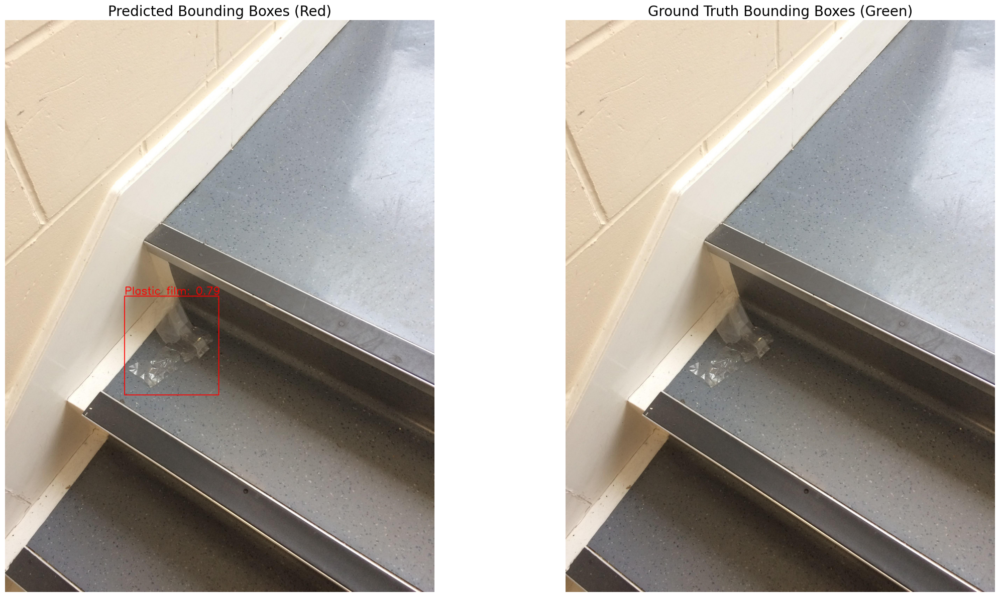


0: 1152x1536 1 Plastic film, 79.2ms
Speed: 13.0ms preprocess, 79.2ms inference, 1.9ms postprocess per image at shape (1, 3, 1152, 1536)
No ground truth label found for /content/yolo_top_categories/test/images/1013.JPG


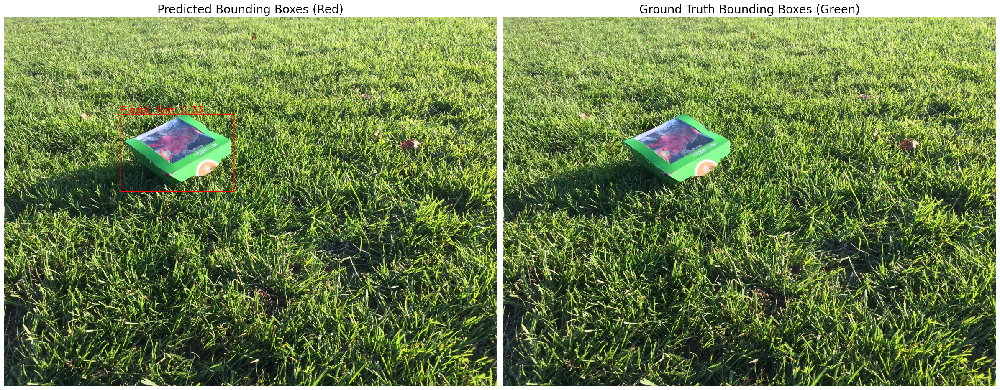


0: 1152x1536 1 Cigarette, 2 Drink cans, 16.1ms
Speed: 16.5ms preprocess, 16.1ms inference, 1.5ms postprocess per image at shape (1, 3, 1152, 1536)
No ground truth label found for /content/yolo_top_categories/test/images/1023.JPG


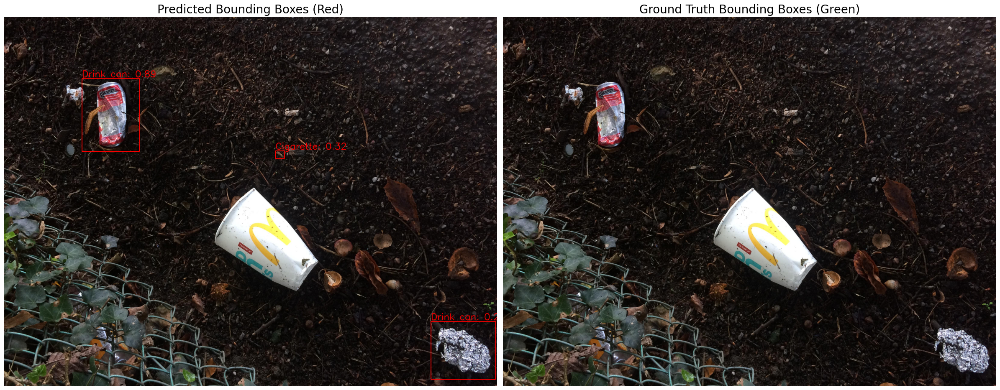


0: 1536x1152 1 Clear plastic bottle, 14.1ms
Speed: 12.9ms preprocess, 14.1ms inference, 1.5ms postprocess per image at shape (1, 3, 1536, 1152)
No ground truth label found for /content/yolo_top_categories/test/images/1026.JPG


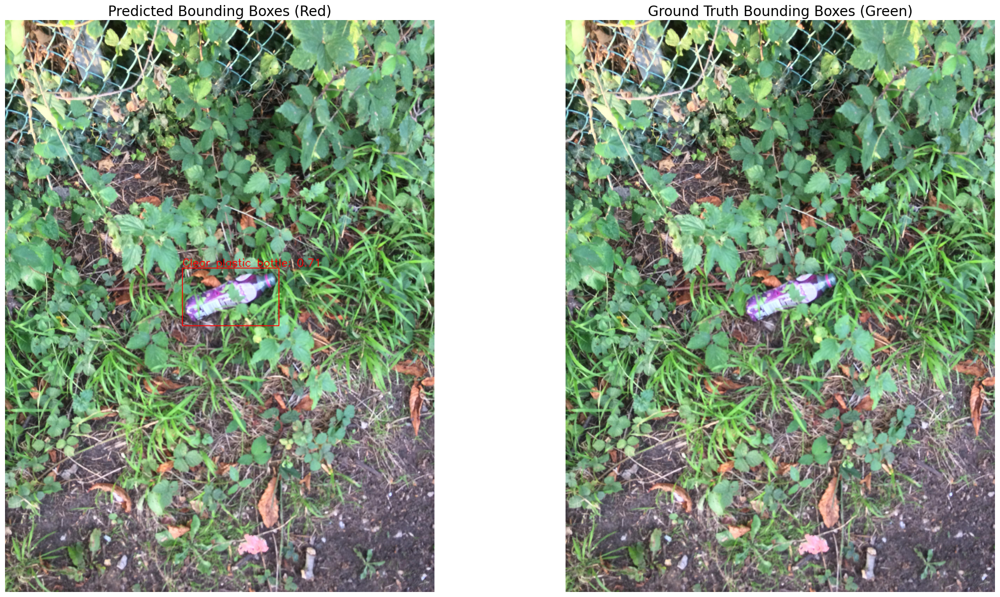


0: 1152x1536 1 Drink can, 14.1ms
Speed: 13.0ms preprocess, 14.1ms inference, 1.5ms postprocess per image at shape (1, 3, 1152, 1536)
No ground truth label found for /content/yolo_top_categories/test/images/1099.JPG


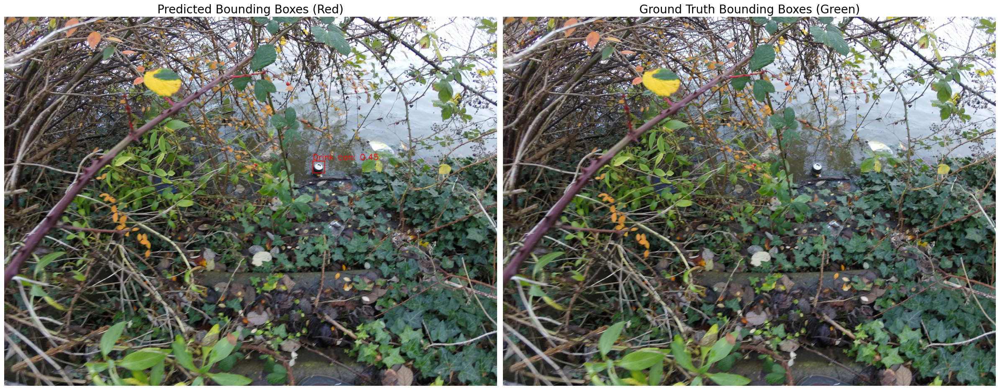

In [ ]:
# Replace with your actual class names
class_names = ['Plastic film', 'Cigarette', 'Clear plastic bottle', 'Plastic bottle cap', 'Drink can']
# List of image paths to visualize
image_paths = [
    '/content/yolo_top_categories/test/images/1012.JPG',
    '/content/yolo_top_categories/test/images/1013.JPG',
    '/content/yolo_top_categories/test/images/1023.JPG',
    '/content/yolo_top_categories/test/images/1026.JPG',
    '/content/yolo_top_categories/test/images/1099.JPG',
]

for image_path in image_paths:
    visualize_predictions(image_path, model, class_names)


In [26]:
from google.colab import files
import os
import shutil

# Specify the directory you want to download
download_dir = '/content/runs/detect/train'

# Create a zip archive of the directory
shutil.make_archive('train9_run', 'zip', download_dir)

# Download the zip file
files.download('/content/train9_run.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>